<a href="https://www.kaggle.com/code/sjagkoo7/fuel-gas-emission-nox-prediction?scriptVersionId=141979146" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

The dataset contains 11 sensor measures aggregated over an hour from a gas turbine for the purpose of study gas emissions name CO and NOx.**Using this dataset will predict the NOx emission.**
* Columns Description :
* `AT - Ambient Temperature`
* `AP- Ambient Pressure`
* `AH-Ambient Humidity`
* `AFDP -Air Filter Differnt Pressure`
* `GTEP - Gas Turbine Exhaust Pressure`
* `TIT- Turbine Inlet Temmperature`
* `TAT- Turbine After Temprature`
* `CDP - Compressure discharge pressure`
* `TEY-Turbine Energy Yield`
* `CO-Carbon Monoxide`
* `NOx-Nitrogen Oxides`

# Importing Libraries

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #visualization
import seaborn as sns # visualization 
from ydata_profiling import profile_report

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-o

/kaggle/input/fuel-gas-emission/train.csv
/kaggle/input/fuel-gas-emission/test.csv


# Reading the Dataset

In [2]:
#reading the train & validation data set
train=pd.read_csv('/kaggle/input/fuel-gas-emission/train.csv')
validation=pd.read_csv('/kaggle/input/fuel-gas-emission/test.csv')

In [3]:
#displaying first 2 rows train dataset
train.head(2)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,12.728,1007.8,87.949,4.4928,24.333,1086.3,550.02,134.41,11.838,0.95374,74.117
1,24.577,1011.4,47.300,2.9115,18.739,1051.0,549.94,104.80,10.141,2.54190,61.887


In [4]:
#displaying first 2 rows validation dataset
validation.head(2)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
0,26.719,1015.1,66.716,3.3469,20.501,1061.7,550.22,111.54,10.649,1.96560
1,12.810,1010.8,97.559,4.5922,24.477,1086.4,549.95,134.39,11.952,0.76573


# Exploring the dataset

In [5]:
#train dataset
#train.shape # total rows & columns
#train.size # total elements in dataset
#len(train) # total rows in dataset
#train.info()

In [6]:
#validation dataset
#validation.shape # total rows & columns
#validation.size # total elements in dataset
#len(validation) # total rows in dataset
#validation.info()

In [7]:
# unique values train dataset
#train.nunique()
# unique values validation dataset
#validation.nunique()

In [8]:
#train dataset - displaying rows if any have duplicate rows
train_duplicated_rows=train[train.duplicated()]
train_duplicated_rows

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX


In [9]:
#validation dataset - displaying rows if any have duplicate rows
validation_duplicated_rows=validation[validation.duplicated()]
validation_duplicated_rows

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO


`no duplicate rows present in train & test dataset`

In [10]:
#null values train dataset
#train.isna().sum()
#null values validation dataset
#validation.isna().sum()

In [11]:
#train dataset - displaying rows if any have null rows
train[train.isna().any(axis=1)]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX


In [12]:
#validation dataset - displaying rows if any have null rows
validation[validation.isna().any(axis=1)]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO


`no null values present in train & test dataset`

In [13]:
# statatics summary train dataset
#train.describe()
# statatics summary validation dataset
#validation.describe()

In [14]:
# train dataset
train_summary=pd.DataFrame(index=train.columns)
train_summary['count']=train.count()
train_summary['nunique']=train.nunique()
train_summary['null']=train.isna().sum()
train_summary['dtype']=train.dtypes
train_summary=pd.concat([train_summary,train.describe().T.drop('count',axis=1)],axis=1)
train_summary

,count,nunique,null,dtype,mean,std,min,25%,50%,75%,max
AT,5187,4788,0,float64,17.123495,7.438222,2.200700,10.995000,16.4690,23.34750,34.5320
AP,5187,356,0,float64,1014.195930,6.330359,995.950000,1009.800000,1013.6000,1018.20000,1034.2000
AH,5187,4843,0,float64,79.047918,13.568107,34.493000,70.171000,82.0860,89.65550,100.1700
AFDP,5187,4588,0,float64,4.086595,0.659002,2.778600,3.643600,4.0237,4.47640,7.3189
GTEP,5187,4041,0,float64,25.626337,4.304616,17.878000,23.344500,24.7360,29.78100,36.0030
TIT,5187,559,0,float64,1084.649104,16.119770,1000.800000,1082.350000,1087.8000,1099.70000,1100.6000
TAT,5187,1462,0,float64,544.581583,8.258511,512.450000,538.975000,549.8600,550.04000,550.6100
TEY,5187,2301,0,float64,135.613792,16.130396,100.320000,130.610000,133.8100,147.66500,169.7200
CDP,5187,2453,0,float64,12.197843,1.141139,9.904400,11.677500,12.0000,13.23000,14.8510
CO,5187,4961,0,float64,1.577711,1.916103,0.003665,0.726965,1.1626,1.75345,43.6220


In [15]:
# validation dataset
validation_summary=pd.DataFrame(index=validation.columns)
validation_summary['count']=validation.count()
validation_summary['nunique']=validation.nunique()
validation_summary['null']=validation.isna().sum()
validation_summary['dtype']=validation.dtypes
validation_summary=pd.concat([validation_summary,validation.describe().T.drop('count',axis=1)],axis=1)
validation_summary

,count,nunique,null,dtype,mean,std,min,25%,50%,75%,max
AT,2224,2159,0,float64,17.086062,7.406734,2.116300,10.945250,16.21100,23.321000,34.4830
AP,2224,304,0,float64,1014.102469,6.205924,995.790000,1010.000000,1013.60000,1018.100000,1033.0000
AH,2224,2138,0,float64,79.471354,13.222722,35.417000,70.938250,82.26850,90.107000,100.1700
AFDP,2224,2097,0,float64,4.100455,0.668542,2.758400,3.650400,4.02990,4.498275,6.9259
GTEP,2224,1983,0,float64,25.750911,4.374657,17.966000,23.405500,24.86050,30.067000,35.8680
TIT,2224,429,0,float64,1084.931700,16.172274,1001.300000,1082.800000,1088.50000,1099.800000,1100.6000
TAT,2224,808,0,float64,544.320288,8.356936,513.170000,538.030000,549.85000,550.032500,550.5700
TEY,2224,1238,0,float64,136.053264,16.391005,100.170000,131.615000,133.83500,149.455000,170.0000
CDP,2224,1477,0,float64,12.230282,1.159049,10.007000,11.693750,12.01900,13.318250,14.8500
CO,2224,2193,0,float64,1.560299,1.669403,0.000388,0.725712,1.13485,1.756475,30.8660


`there is  no any feature having catelogrical values and all values are numerical values and following the regression pattern`

In [16]:
# detail report - dasborad train dataset
train.profile_report(title='detail report - dasborad train dataset',progress_bar=False)

In [17]:
# detail report - dasborad validation dataset
validation.profile_report(title='detail report - dasborad test dataset',progress_bar=False)

# Co-Relation Matrix

In [18]:
# train dataset
corr_train=train.corr()
corr_train

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
AT,1.000000,-0.518430,-0.551429,-0.236936,-0.032028,0.029898,0.224902,-0.201890,-0.092854,-0.134376,-0.652353
AP,-0.518430,1.000000,0.046504,0.224639,0.126941,0.070158,-0.269750,0.209707,0.182851,0.114843,0.397132
AH,-0.551429,0.046504,1.000000,-0.100609,-0.215458,-0.231094,0.076620,-0.122170,-0.194339,0.135317,0.204171
AFDP,-0.236936,0.224639,-0.100609,1.000000,0.889292,0.787936,-0.737788,0.904116,0.898236,-0.348360,-0.029571
GTEP,-0.032028,0.126941,-0.215458,0.889292,1.000000,0.881917,-0.806209,0.977291,0.994502,-0.437166,-0.244853
TIT,0.029898,0.070158,-0.231094,0.787936,0.881917,1.000000,-0.443067,0.904511,0.891831,-0.634837,-0.227484
TAT,0.224902,-0.269750,0.076620,-0.737788,-0.806209,-0.443067,1.000000,-0.762790,-0.797476,0.026152,0.081853
TEY,-0.201890,0.209707,-0.122170,0.904116,0.977291,0.904511,-0.762790,1.000000,0.988261,-0.458176,-0.121759
CDP,-0.092854,0.182851,-0.194339,0.898236,0.994502,0.891831,-0.797476,0.988261,1.000000,-0.439023,-0.194726
CO,-0.134376,0.114843,0.135317,-0.348360,-0.437166,-0.634837,0.026152,-0.458176,-0.439023,1.000000,0.398577


Text(0.5, 1.0, 'Train Corelation Matrix\n')

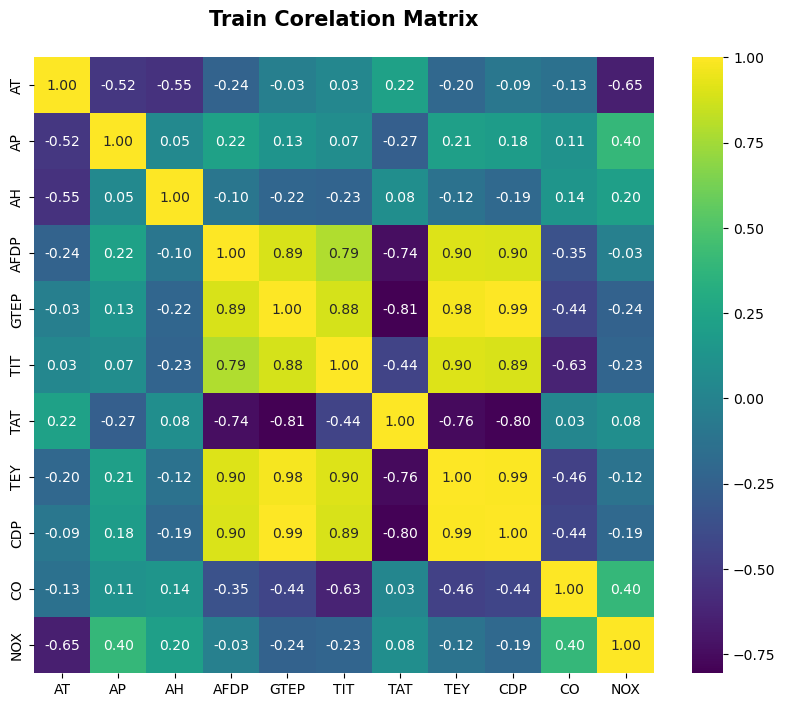

In [19]:
plt.figure(figsize=(10,8))
sns.heatmap(corr_train,cmap='viridis',fmt='.2f',annot=True)
plt.title('Train Corelation Matrix\n',fontsize=15,fontweight='bold')

`AP,CO,AFDP,CDP,TEY,TIT,GTEP` - these are higly corelated features and NOX is target variable.

In [20]:
# validation dataset
corr_validation=validation.corr()
corr_validation

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
AT,1.000000,-0.513337,-0.575539,-0.238299,-0.040717,0.022996,0.234533,-0.209541,-0.102479,-0.148364
AP,-0.513337,1.000000,0.073223,0.182297,0.088476,0.027992,-0.249696,0.169153,0.143171,0.142763
AH,-0.575539,0.073223,1.000000,-0.079090,-0.198115,-0.215115,0.058616,-0.100042,-0.173127,0.139066
AFDP,-0.238299,0.182297,-0.079090,1.000000,0.893642,0.794727,-0.751340,0.906897,0.902452,-0.408099
GTEP,-0.040717,0.088476,-0.198115,0.893642,1.000000,0.886968,-0.816981,0.977995,0.994676,-0.508173
TIT,0.022996,0.027992,-0.215115,0.794727,0.886968,1.000000,-0.469586,0.906960,0.896051,-0.695487
TAT,0.234533,-0.249696,0.058616,-0.751340,-0.816981,-0.469586,1.000000,-0.778375,-0.809588,0.096416
TEY,-0.209541,0.169153,-0.100042,0.906897,0.977995,0.906960,-0.778375,1.000000,0.988857,-0.521392
CDP,-0.102479,0.143171,-0.173127,0.902452,0.994676,0.896051,-0.809588,0.988857,1.000000,-0.508433
CO,-0.148364,0.142763,0.139066,-0.408099,-0.508173,-0.695487,0.096416,-0.521392,-0.508433,1.000000


Text(0.5, 1.0, 'Test Corelation Matrix\n')

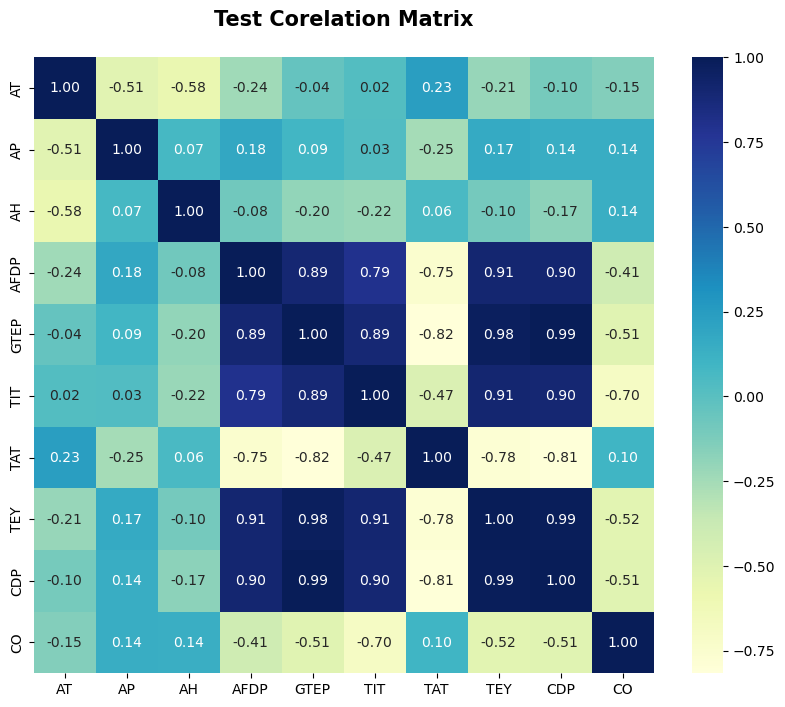

In [21]:
plt.figure(figsize=(10,8))
sns.heatmap(corr_validation,cmap='YlGnBu',fmt='.2f',annot=True)
plt.title('Test Corelation Matrix\n',fontsize=15,fontweight='bold')

# Outliers

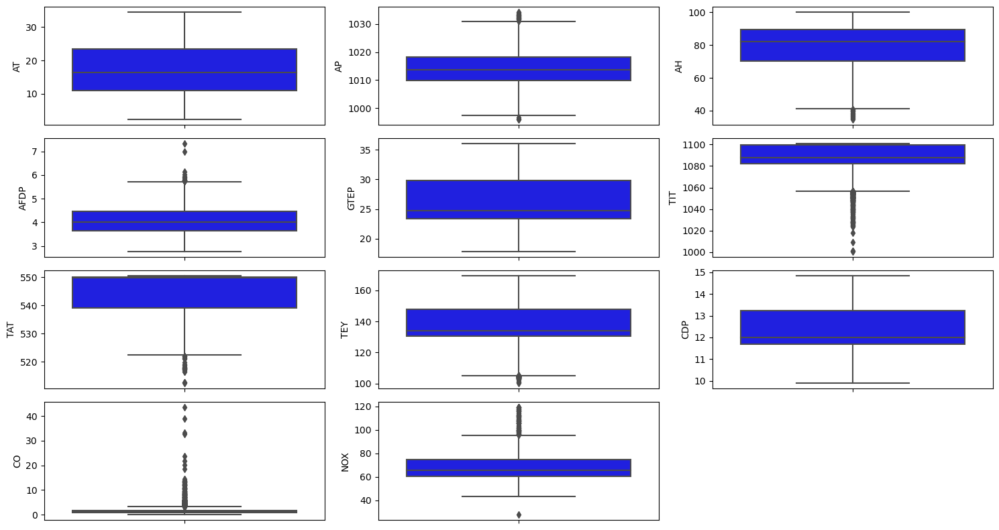

In [22]:
#train dataset
plt.figure(figsize=(15,8))
col_list=train.columns
for i in range (len(train.columns)):
    plt.subplot(4,3,i+1)
    sns.boxplot(data=train,y=col_list[i],color='blue')
plt.tight_layout()

`TIT,CO` having more outliers as compare to `AP,AH,AFDP,TEY`

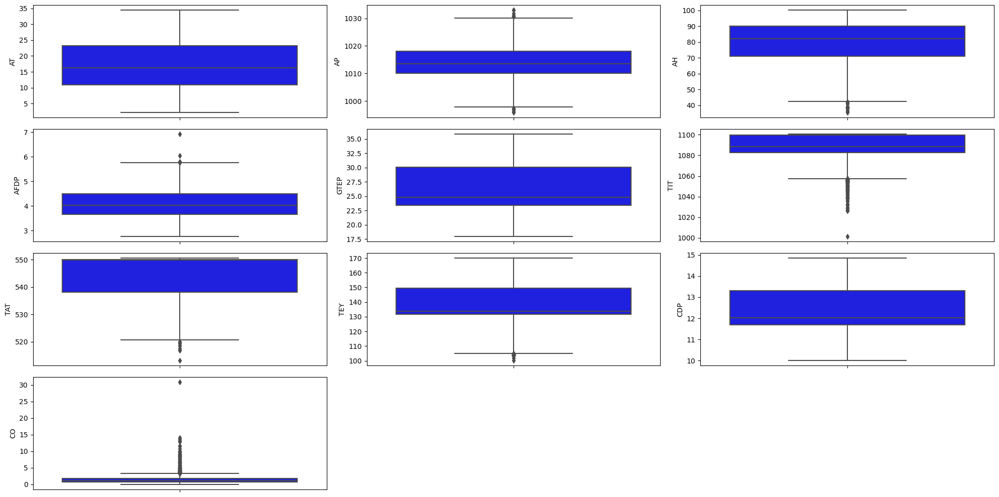

In [23]:
#test Dataset
plt.figure(figsize=(20,10))
col_list=validation.columns
for i in range (len(validation.columns)):
    plt.subplot(4,3,i+1)
    sns.boxplot(data=validation,y=col_list[i],color='blue')
plt.tight_layout()

`TIT,CO` having more outliers as compare to `AP,AH,AFDP,TEY`

### `**Split the data into Features and target variables**`

In [24]:
#Spliting target variable and independent variables
X=train.drop('NOX',axis=1)
y=train['NOX']
X.head(2)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
0,12.728,1007.8,87.949,4.4928,24.333,1086.3,550.02,134.41,11.838,0.95374
1,24.577,1011.4,47.300,2.9115,18.739,1051.0,549.94,104.80,10.141,2.54190


### `**Create a Pipleline with scaler as StandardScaler and machine learning algorithm as RandomForestRegressor**`

# Random Forest Regressor

In [25]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,KFold,cross_val_score 
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics 

In [26]:
# spliiting X and y in train and test set 
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8, random_state=42)

### `**We create a pipeline that includes Feature Scaling using StandardScaler and a Random Forest regression model.**`

In [27]:
#creating the pipleine
pipeline=Pipeline([
    ('scaler', StandardScaler()), # feature scaling
    ('rfr', RandomForestRegressor(n_estimators=100, criterion="squared_error",random_state=42)) #random forest regressor                   
])

In [28]:
# accessing feature scaling using pipeline
X_scaled=pipeline.named_steps['scaler'].fit_transform(X_train) # X_scaled=pipeline.named_steps['scaler'].fit_transform(X_train) 
X_scaled=pd.DataFrame(X_scaled,columns=X_train.columns)
X_scaled.head(2)

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
0,-0.664527,0.297486,-0.503922,1.380946,1.474503,0.962533,-1.634082,1.470450,1.457485,-0.362838
1,0.117006,0.044024,-1.376898,-1.757349,-1.429686,-1.677871,0.665325,-1.489591,-1.489156,0.688356


### `**We define a K-Fold cross-validator with 5 splits (n_splits=5).**`
### `** We use the cross_val_score function with the pipeline, specifying the cross-validator (cv=kf). This function automatically applies the feature scaling and model fitting for each fold.**`

In [29]:
#cross validation
kf=KFold(n_splits=5)
score=cross_val_score(pipeline,X,y,cv=kf)
print(f"Validation Score : {score} ")
print(f"Average Score :{score.mean()}")

Validation Score : [0.91898809 0.90175103 0.90473295 0.90582198 0.90114161] 
Average Score :0.9064871306226315


In [30]:
#model training & prediction
pipeline.fit(X_train,y_train)
y_pred=pipeline.predict(X_test)

In [31]:
#model score
acc_rfr= metrics.r2_score(y_test,y_pred)
acc_rfr

0.9228247685427022

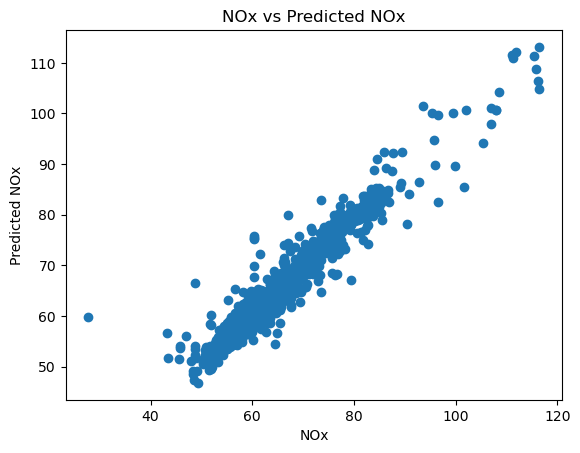

In [32]:
# Visualizing the differences between actual NOx and predicted NOx
plt.scatter(y_test, y_pred)
plt.xlabel("NOx")
plt.ylabel("Predicted NOx")
plt.title("NOx vs Predicted NOx")
plt.show()

In [33]:
#model training & prediction for validation dataset
pipeline.fit(X,y)
y_pred_rfr=pipeline.predict(validation)
y_pred_rfr

array([53.79829, 73.0623 , 65.25076, ..., 53.80066, 65.77936, 76.21978])